# Analysis of 10X scRNA-seq data, Benakis et al. 2022

In [1]:
import numpy as np
import scipy as sci
import pandas as pd
import matplotlib.pyplot as pl
import scanpy as sc
from scipy.sparse import csr_matrix
from matplotlib import rcParams
import seaborn as sns
import gseapy as gp

sc.settings.verbosity = 3
sc.logging.print_header()

/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


scanpy==1.6.0 anndata==0.7.5 umap==0.4.5 numpy==1.19.4 scipy==1.5.4 pandas==1.1.4 scikit-learn==0.23.1 statsmodels==0.10.1 python-igraph==0.8.0 louvain==0.7.0 leidenalg==0.7.0


In [2]:
sc.set_figure_params(vector_friendly=True, color_map='viridis', dpi_save=300, transparent=True, frameon=False)

In [3]:
sc.settings.figdir = './figures/'

## Read and write data

In [1]:
adata_wt_na=sc.read('./119_Naive_WT/filtered_gene_bc_matrices.h5ad')
adata_wt_st=sc.read('./117_Stroke_WT/filtered_gene_bc_matrices.h5ad')
adata_rag_na=sc.read('./120_Naive_Rag/filtered_gene_bc_matrices.h5ad')
adata_rag_st=sc.read('./118_Stroke_Rag/filtered_gene_bc_matrices.h5ad')

In [96]:
adata_all = adata_wt_na.concatenate(adata_wt_st,adata_rag_na,adata_rag_st,batch_key='sample',batch_categories=['wt_naive','wt_stroke','rag_naive','rag_stroke'])

## Preprocessing

### QC

In [97]:
# Quality control - calculate QC covariates for all anndata objects
adata_all.obs['n_counts'] = adata_all.X.sum(1)
adata_all.obs['log_counts'] = np.log(adata_all.obs['n_counts'])
adata_all.obs['n_genes'] = (adata_all.X > 0).sum(1)
mt_gene_mask = [gene.startswith('mt-') for gene in adata_all.var_names]
mt_gene_index = np.where(mt_gene_mask)[0]
adata_all.obs['mt_fraction'] = adata_all.X[:,mt_gene_index].sum(1) / adata_all.X.sum(1)

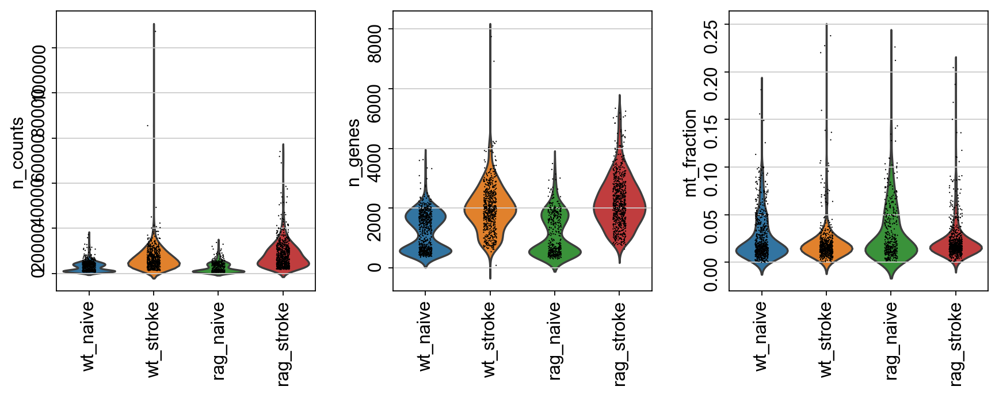

In [98]:
# Quality control - plot QC metrics
#Sample quality plots
sc.pl.violin(adata_all, ['n_counts','n_genes', 'mt_fraction'], groupby='sample', size=1, log=False,rotation=90)
#sc.pl.violin(alldays, 'mt_frac', groupby='day')

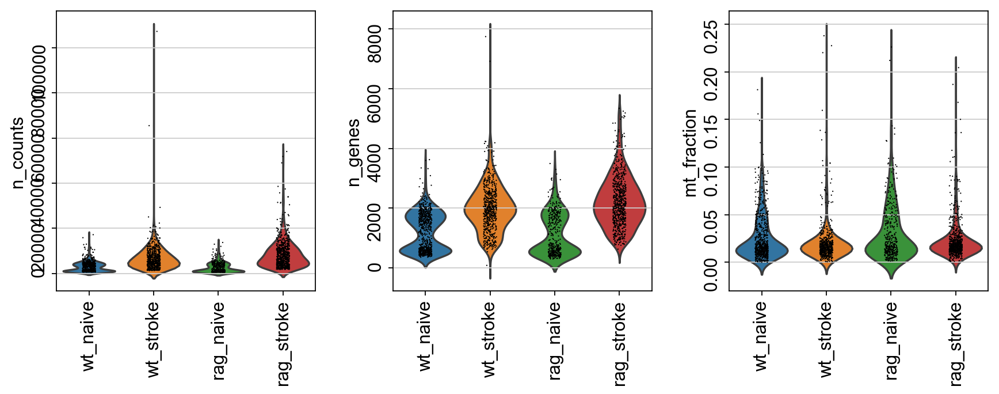

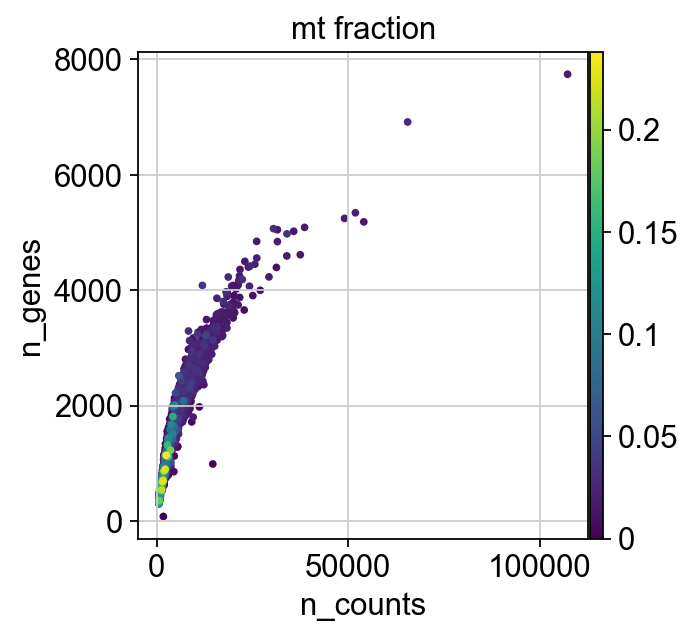

In [99]:
# Quality control - plot QC metrics
#Sample quality plots
sc.pl.violin(adata_all, ['n_counts','n_genes', 'mt_fraction'], groupby='sample', size=1, log=False,rotation=90)
#sc.pl.violin(alldays, 'mt_frac', groupby='day')
sc.pl.scatter(adata_all,y='n_genes',x='n_counts',color='mt_fraction')

#### cell filtering

In [100]:
#Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_all.n_obs))

adata_all = adata_all[adata_all.obs['mt_fraction'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata_all.n_obs))

sc.pp.filter_cells(adata_all, max_counts=48000)
print('Number of cells after count filter: {:d}'.format(adata_all.n_obs))

Total number of cells: 2468
Number of cells after MT filter: 2426
filtered out 5 cells that have more than  48000 counts
Number of cells after count filter: 2421


#### gene filtering

In [101]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata_all.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata_all, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata_all.n_vars))

Total number of genes: 27998
filtered out 16010 genes that are detected in less than 10 cells
Number of genes after cell filter: 11988


#### doublet detection

In [12]:
import scrublet as scr
import scipy.io
import time

In [108]:
adata_all.obs['doublet_score'] = np.zeros(len(adata_all.obs['sample']))

In [74]:
adata_wt_na =s c.read('./119_Naive_WT/filtered_gene_bc_matrices.h5ad')

In [109]:
adata_sub = adata_wt_na.copy()
y_new = [s + '-wt_naive' for s in adata_sub.obs_names]
adata_sub.obs_names = y_new
adata_sub = adata_sub[np.isin(adata_sub.obs_names,adata_all.obs_names)].copy()

In [110]:
scrub = scr.Scrublet(adata_sub.X)
doublet_scores_wt_na, predicted_doublets_wt_na = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.47
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 5.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 10.1%
Elapsed time: 0.7 seconds


Detected doublet rate = 5.2%
Estimated detectable doublet fraction = 26.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 19.9%


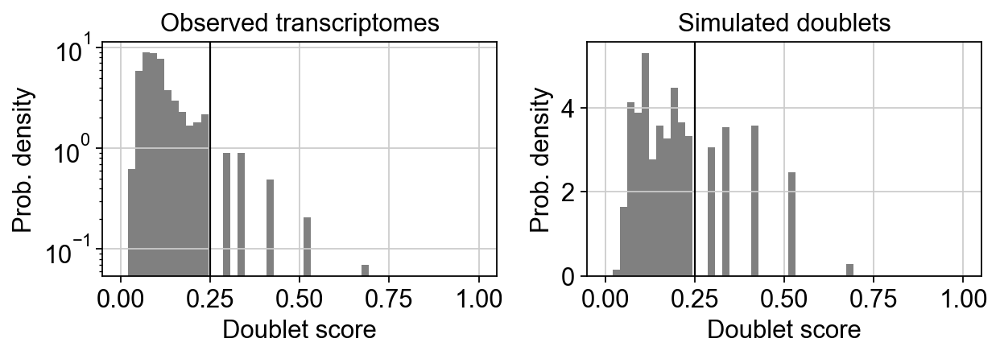

In [111]:
scrub.call_doublets(threshold=0.25)
scrub.plot_histogram();

In [112]:
print('Running UMAP...')
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
print('Done.')

Running UMAP...
Done.


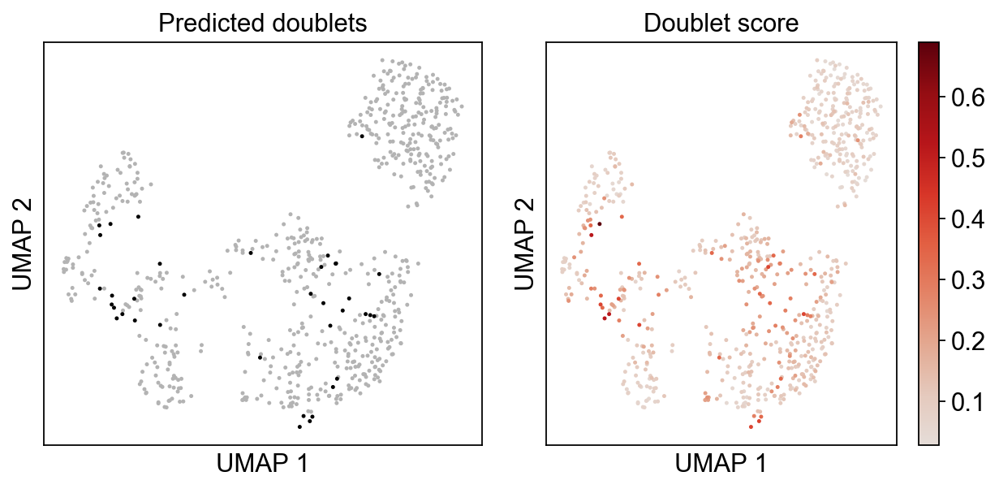

In [113]:
scrub.plot_embedding('UMAP', order_points=True);

In [114]:
ix = np.isin(adata_all.obs['sample'],'wt_naive')
adata_all.obs['doublet_score'][ix] = list(doublet_scores_wt_na)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [ ]:
adata_wt_st=sc.read('./117_Stroke_WT/filtered_gene_bc_matrices.h5ad')

In [115]:
adata_sub = adata_wt_st.copy()
y_new=[s + '-wt_stroke' for s in adata_sub.obs_names]
adata_sub.obs_names = y_new
adata_sub = adata_sub[np.isin(adata_sub.obs_names,adata_all.obs_names)].copy()

In [116]:
scrub = scr.Scrublet(adata_sub.X)
doublet_scores_wt_stroke, predicted_doublets_wt_stroke = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.44
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 20.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.6%
Elapsed time: 0.9 seconds


Detected doublet rate = 2.8%
Estimated detectable doublet fraction = 40.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 7.0%


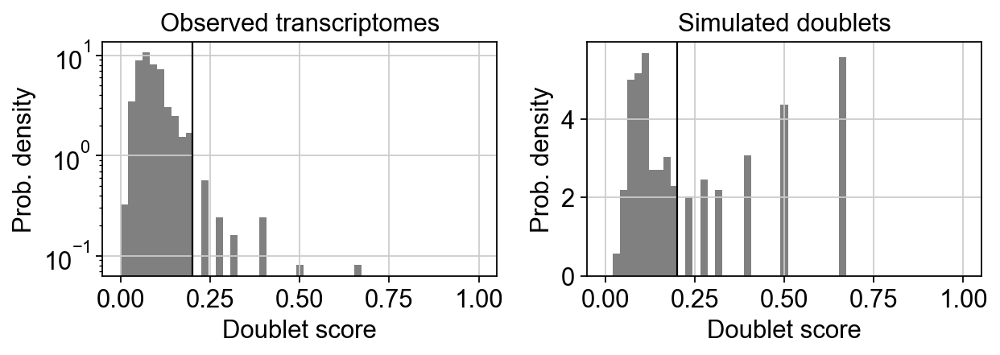

In [117]:
scrub.call_doublets(threshold=0.2)
scrub.plot_histogram();

Running UMAP...


/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


Done.


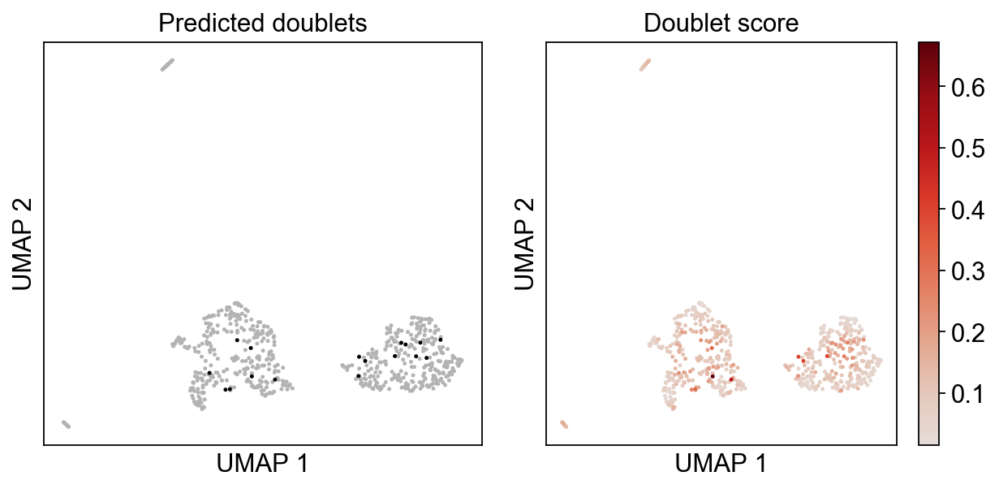

In [118]:
print('Running UMAP...')
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
print('Done.')
scrub.plot_embedding('UMAP', order_points=True);

In [119]:
ix = np.isin(adata_all.obs['sample'],'wt_stroke')
adata_all.obs['doublet_score'][ix] = list(doublet_scores_wt_stroke)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
adata_rag_na=sc.read('./120_Naive_Rag/filtered_gene_bc_matrices.h5ad')

In [120]:
adata_sub = adata_rag_na.copy()
y_new = [s + '-rag_naive' for s in adata_sub.obs_names]
adata_sub.obs_names = y_new
adata_sub = adata_sub[np.isin(adata_sub.obs_names, adata_all.obs_names)].copy()

In [121]:
scrub = scr.Scrublet(adata_sub.X)
doublet_scores_rag_naive, predicted_doublets_rag_naive = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.42
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 1.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 25.0%
Elapsed time: 0.4 seconds


Detected doublet rate = 1.0%
Estimated detectable doublet fraction = 5.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 19.5%


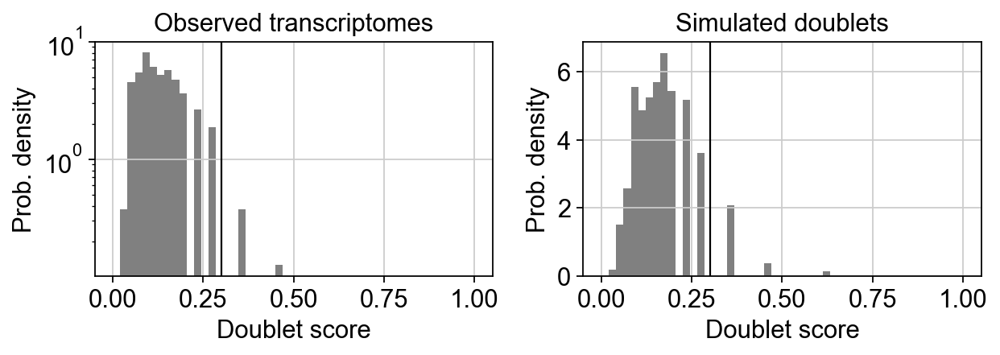

In [122]:
scrub.call_doublets(threshold=0.3)
scrub.plot_histogram();

Running UMAP...
Done.


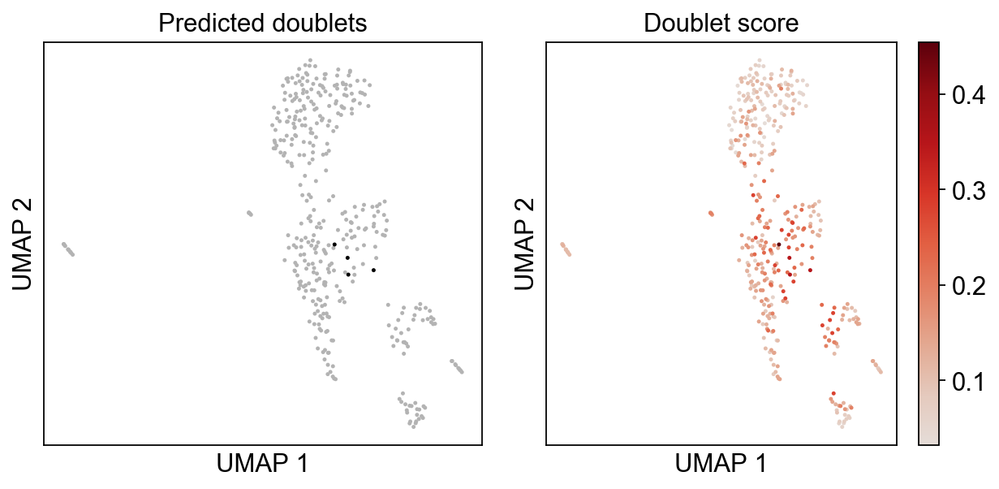

In [123]:
print('Running UMAP...')
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
print('Done.')
scrub.plot_embedding('UMAP', order_points=True);

In [124]:
ix = np.isin(adata_all.obs['sample'],'rag_naive')
adata_all.obs['doublet_score'][ix]=list(doublet_scores_rag_naive)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
adata_rag_st=sc.read('./118_Stroke_Rag/filtered_gene_bc_matrices.h5ad')

In [125]:
adata_sub = adata_rag_st.copy()
y_new = [s + '-rag_stroke' for s in adata_sub.obs_names]
adata_sub.obs_names = y_new
adata_sub = adata_sub[np.isin(adata_sub.obs_names,adata_all.obs_names)].copy()

In [126]:
scrub = scr.Scrublet(adata_sub.X)
doublet_scores_rag_stroke, predicted_doublets_rag_stroke = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.46
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 14.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.0%
Elapsed time: 1.0 seconds


Detected doublet rate = 2.5%
Estimated detectable doublet fraction = 41.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.1%
Running UMAP...
Done.


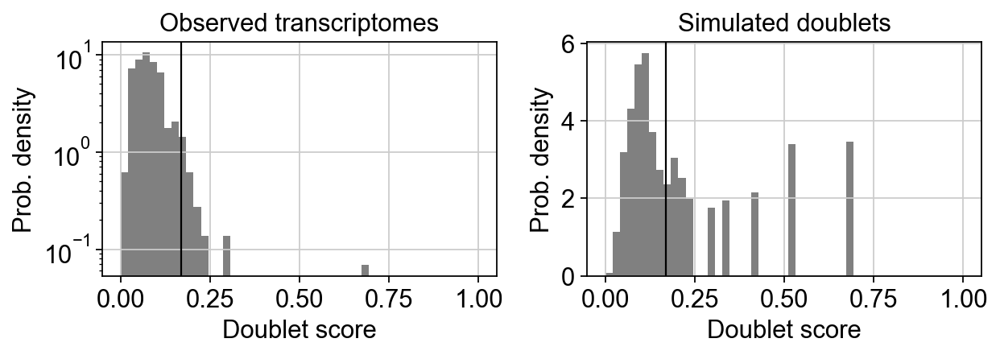

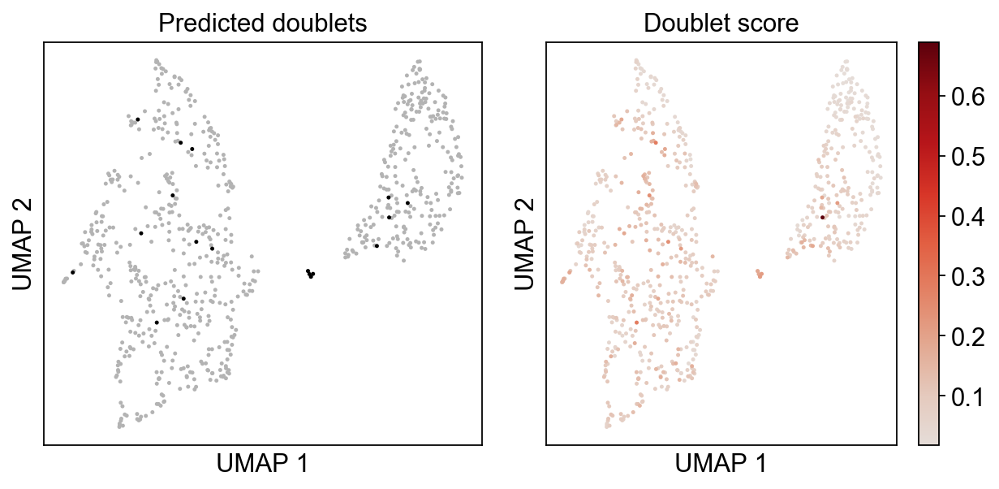

In [127]:
scrub.call_doublets(threshold=0.17)
scrub.plot_histogram();

print('Running UMAP...')
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
print('Done.')
scrub.plot_embedding('UMAP', order_points=True);

In [128]:
ix = np.isin(adata_all.obs['sample'],'rag_stroke')
adata_all.obs['doublet_score'][ix]=list(doublet_scores_rag_stroke)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


#### filtering doublets

In [134]:
ix = (np.isin(adata_all.obs['sample'],'wt_naive')) & (adata_all.obs['doublet_score']>=0.25)
adata_all = adata_all[np.invert(ix)].copy()

In [136]:
ix = (np.isin(adata_all.obs['sample'],'wt_stroke')) & (adata_all.obs['doublet_score']>=0.2)
adata_all = adata_all[np.invert(ix)].copy()

In [138]:
ix = (np.isin(adata_all.obs['sample'],'rag_naive')) & (adata_all.obs['doublet_score']>=0.3)
adata_all = adata_all[np.invert(ix)].copy()

In [139]:
ix = (np.isin(adata_all.obs['sample'],'rag_stroke')) & (adata_all.obs['doublet_score']>=0.17)
adata_all = adata_all[np.invert(ix)].copy()

### QC metrics after filtering

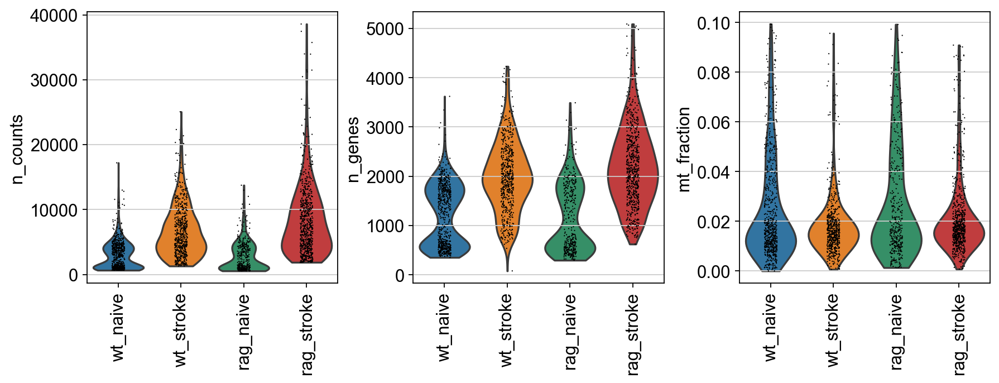

In [18]:
sc.pl.violin(adata_all, ['n_counts','n_genes', 'mt_fraction'], groupby='sample', size=1, log=False,rotation=90)

In [26]:
adata_all.obs[['n_genes','n_counts','sample']].groupby(by='sample').median().to_csv('./qc_metric.csv')

### Count normalization

In [142]:
adata_all.X = sci.sparse.csr_matrix(scanpy.preprocessing.simple.normalize_per_cell_weinreb16_deprecated(adata_all.X.toarray(), max_fraction=0.05, mult_with_mean=True))

In [143]:
sc.pp.log1p(adata_all)
adata_all.raw = adata_all

### Highly variable gene selection

In [144]:
disp_filter = sc.pp.filter_genes_dispersion(adata_all.X, flavor='cell_ranger', n_top_genes=3000, log=False)

print('Number of highly variable genes: {:d}'.format(adata_all[:, disp_filter['gene_subset']].n_vars))
adata_all.var['highly_variable_genes'] = disp_filter['gene_subset']
adata_all.var['expression_mean'] = disp_filter['means']
adata_all.var['dispersion'] = disp_filter['dispersions']

Number of highly variable genes: 2999


In [145]:
# Create a data set with only the highly variable genes - note this was necessary in older versions of scanpy used for initial analyses.
adata_hvg = adata_all.copy()
adata_hvg = adata_hvg[:, disp_filter['gene_subset']].copy()

## Embedding - PCA and kNN

In [150]:
sc.pp.pca(adata_hvg)
sc.pp.neighbors(adata_hvg)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:06.89) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix


## Visualization - UMAP

In [26]:
sc.tl.umap(adata_hvg, min_dist=1)
adata_all.obsm['X_umap'] = adata_hvg.obsm['X_umap']
adata_raw.obsm['X_umap'] = adata_hvg.obsm['X_umap']

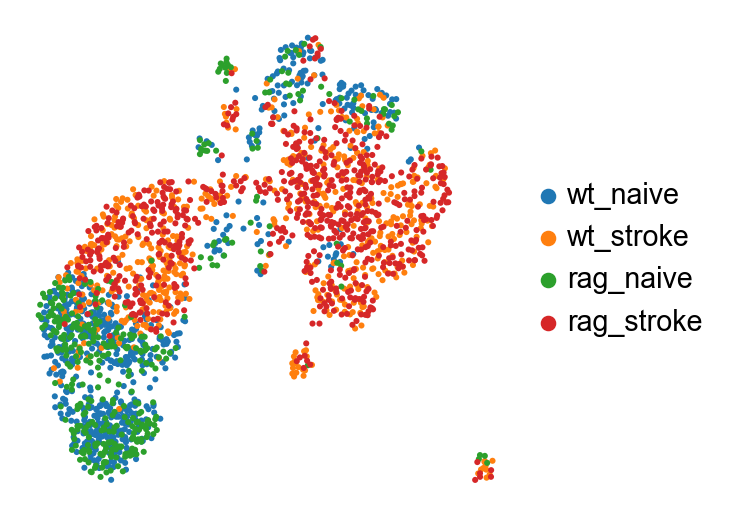

In [27]:
sc.pl.umap(adata_hvg, color=['sample'], title=[''], size=30, save='_FIG_1D_samples.pdf')

## Marker genes

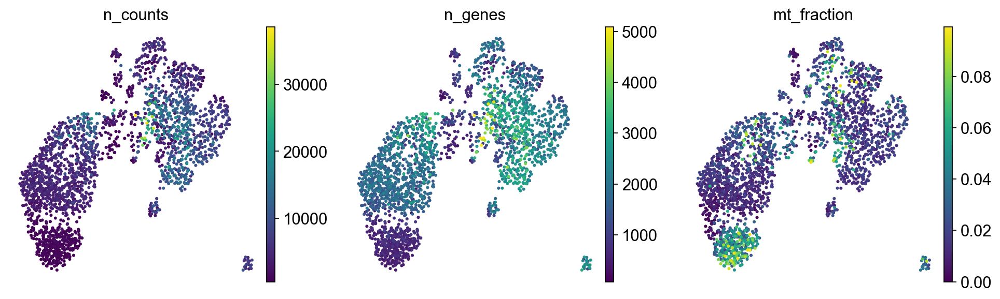

In [31]:
sc.pl.umap(adata_hvg, color=['n_counts', 'n_genes', 'mt_fraction'], size=30)

Resting Microglia: Fcrls, P2ry12, Tmem119, Cx3cr1, Selplg, Crybb1, P2ry13
Activated Microglia: Csf1r, Spp1, Tlr2, Il-1β, ApoE, TREM2, (down-regulation of resting microglial genes)
Monocytes/Macrophages/PMN: Ly6C, Lyz2, CCR2, CD11c

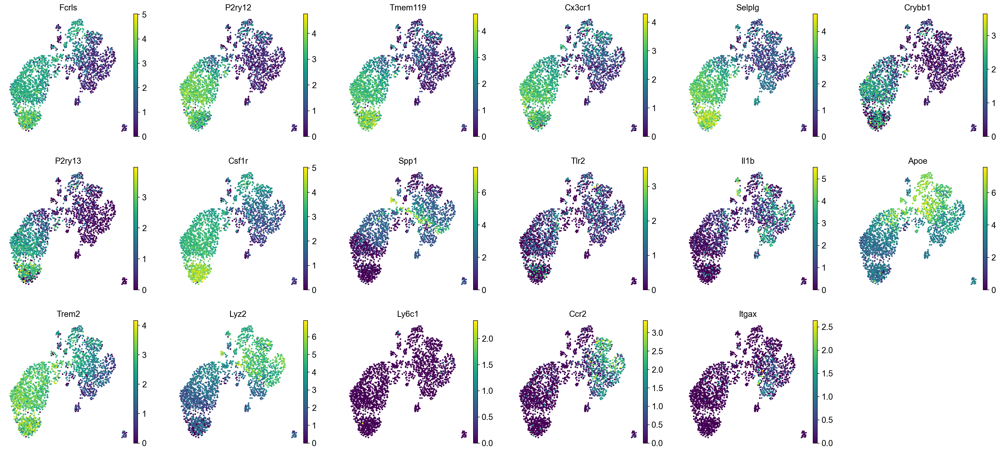

In [32]:
sc.pl.umap(adata_all,
           color=['Fcrls', 'P2ry12', 'Tmem119', 'Cx3cr1', 'Selplg', 'Crybb1', 'P2ry13', 'Csf1r', 'Spp1', 'Tlr2', 
                  'Il1b', 'Apoe', 'Trem2', 'Lyz2', 'Ly6c1', 'Ccr2', 'Itgax'],
           size=30, ncols=6, save='_FIG_S1A_markers.pdf')

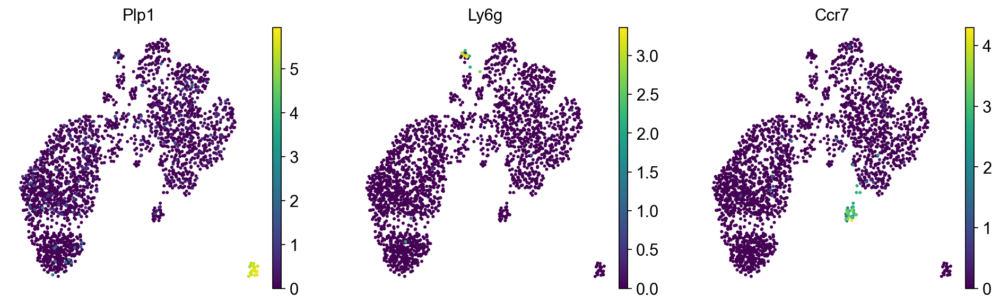

In [34]:
sc.pl.umap(adata_all, color=['Plp1', 'Ly6g', 'Ccr7'], size=30, ncols=6)

## Clustering

In [164]:
sc.tl.louvain(adata_hvg, resolution=1)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.18) --> found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


In [193]:
sc.tl.louvain(adata_hvg, resolution=0.3, restrict_to=('louvain',['1']), key_added='louvain_r1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.30) --> found 2 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical)


In [194]:
sc.tl.louvain(adata_hvg, resolution=0.3, restrict_to=('louvain_r1',['10']), key_added='louvain_r2')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.01) --> found 2 clusters and added
    'louvain_r2', the cluster labels (adata.obs, categorical)


In [165]:
adata_all.obs['louvain'] = adata_hvg.obs['louvain']
adata_raw.obs['louvain'] = adata_hvg.obs['louvain']

In [182]:
adata_all.obs['louvain_refined'] = adata_hvg.obs['louvain_refined']
adata_raw.obs['louvain_refined'] = adata_hvg.obs['louvain_refined']

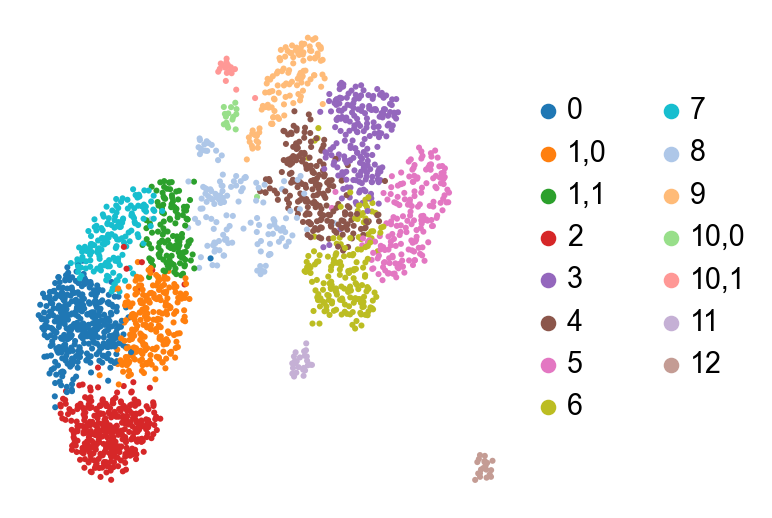

In [56]:
sc.pl.umap(adata_hvg, color=['louvain_r2'], title=[''], size=30, save='_FIG_2B_clusters.pdf')

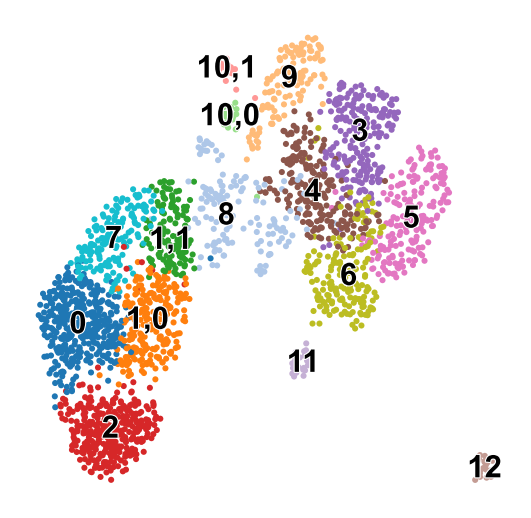

In [57]:
sc.pl.umap(adata_hvg, color=['louvain_r2'], title=[''], legend_loc='on data', legend_fontoutline=1, size=30, 
           save='_FIG_2S1A_clusters.pdf'
          )

## Cluster annotation

In [167]:
sc.tl.rank_genes_groups(adata_all,groupby='louvain')

ranking genes
    finished (0:00:02.08) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


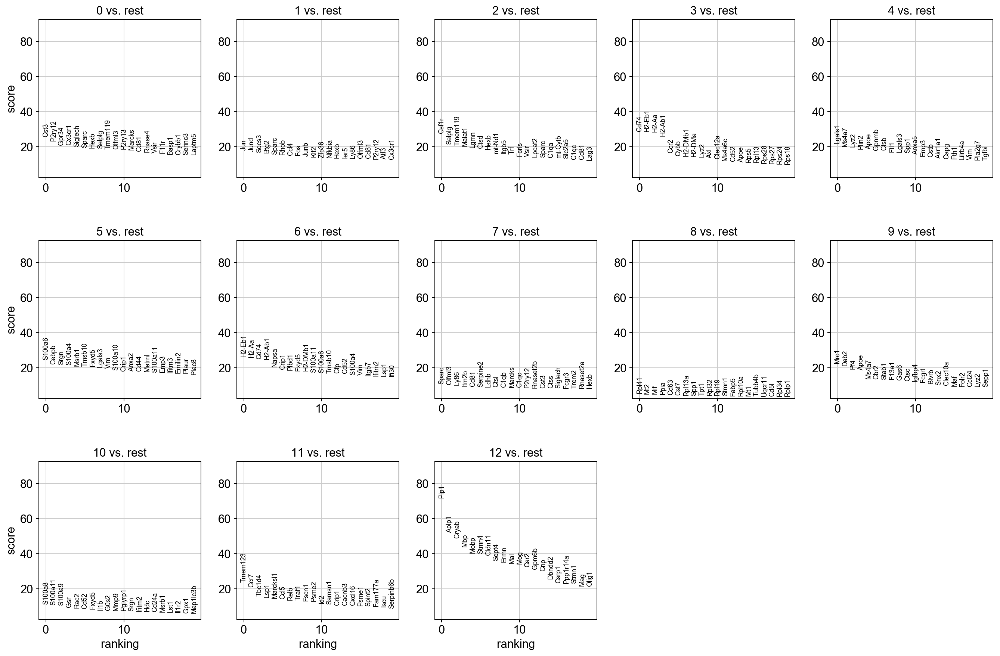

In [168]:
sc.pl.rank_genes_groups(adata_all, n_panels_per_row=5)

In [ ]:
ref_cluster=pd.Categorical(adata_hvg.obs['louvain_r2'],
                           categories=['Microglia','Activated Microglia',
                                       'Macrophages/Monocytes/PMN','Ccr7+','Neutrophils','Neurons','Unassigned'])

ix = np.isin(adata_hvg.obs['louvain_r2'], ['0','1,0','2','7'])
ref_cluster[ix] = 'Microglia'

ix = np.isin(adata_hvg.obs['louvain_r2'], ['1,1'])
ref_cluster[ix] = 'Activated Microglia'

ix = np.isin(adata_hvg.obs['louvain'],['3','4','5','6','10,0'])
ref_cluster[ix] = 'Macrophages/Monocytes/PMN'

ix = np.isin(adata_hvg.obs['louvain'],['10,1'])
ref_cluster[ix] = 'Neutrophils'

ix = np.isin(adata_hvg.obs['louvain'],['11'])
ref_cluster[ix] = 'Ccr7+'

ix = np.isin(adata_hvg.obs['louvain'],['12'])
ref_cluster[ix] = 'Neurons'

ix = np.isin(adata_hvg.obs['louvain'],['8','9'])
ref_cluster[ix] = 'Unassigned'

adata_hvg.obs['cluster_anno'] = ref_cluster

In [50]:
## merge and annotate clusters
class_map = {
    '0':'Microglia',
    '1,0':'Microglia',
    '2':'Microglia',
    '7':'Microglia',

    '1,1':'Activated Microglia',
    
    '3': 'Macrophages/Monocytes/PMN',
    '4': 'Macrophages/Monocytes/PMN',
    '5': 'Macrophages/Monocytes/PMN',
    '6': 'Macrophages/Monocytes/PMN',
    '10,0': 'Macrophages/Monocytes/PMN',
    
    '10,1': 'Neutrophils',
    '11': 'Ccr7+',
    '12': 'Neurons',
    '8': 'Unassigned',
    '9': 'Unassigned'
    }

adata_hvg.obs['cluster_anno'] = adata_hvg.obs['louvain_r2']
adata_hvg.obs['cluster_anno'] = [
            class_map[x] if x in class_map.keys() else x
            for x in adata_hvg.obs['cluster_anno'].values
        ]

In [51]:
adata_all.obs['cluster_anno']=adata_hvg.obs['cluster_anno']
adata_all.obs['louvain_r2']=adata_hvg.obs['louvain_r2']

... storing 'cluster_anno' as categorical


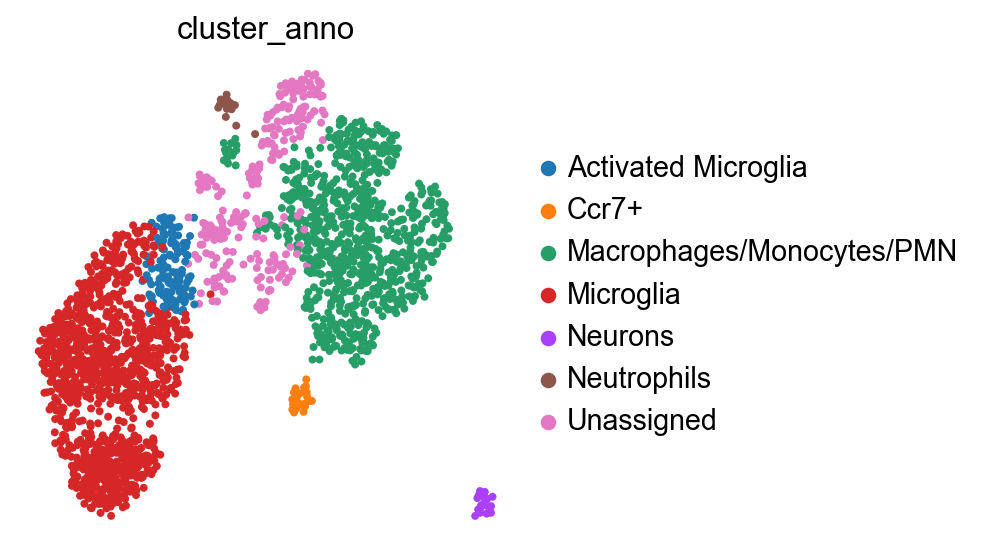

In [52]:
sc.pl.umap(adata_hvg, color=['cluster_anno'])

## Cluster connectivity and lineage relations - PAGA

In [41]:
sc.tl.paga(adata_hvg,groups='louvain_r2')

... storing 'cluster_anno' as categorical


running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


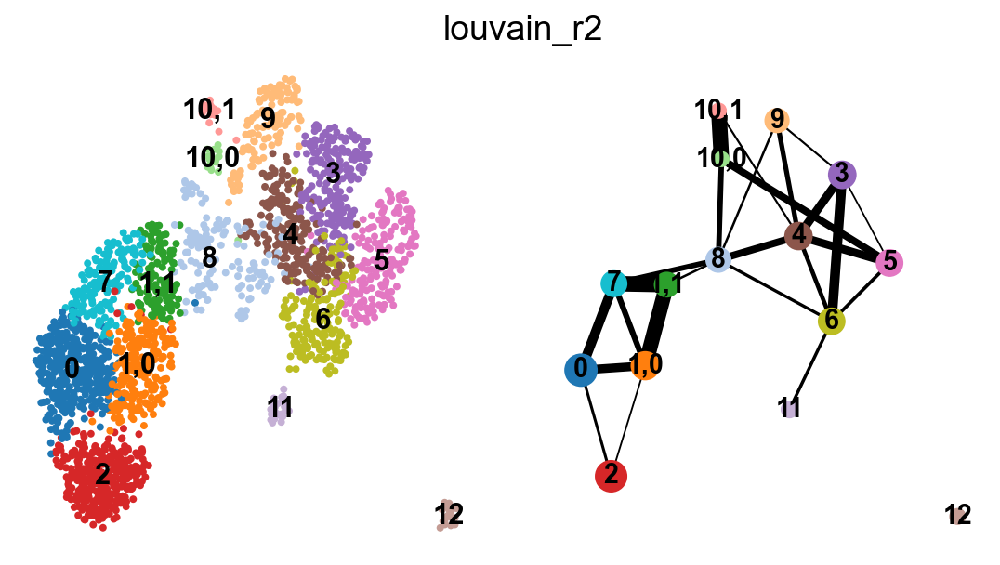

In [42]:
sc.pl.paga_compare(adata_hvg,threshold=0.1)

## Analyses of Microglia

subset to microglia clusters

In [11]:
adata_m=adata_all[np.isin(adata_hvg.obs['louvain_r2'],['2','0','7','1,1','1,0'])].copy()

In [12]:
adata_m_hvg=adata_hvg[np.isin(adata_hvg.obs['louvain_r2'],['2','0','7','1,1','1,0'])].copy()

### embedding and clustering

In [13]:
sc.pp.pca(adata_m_hvg)
sc.pp.neighbors(adata_m_hvg)
sc.tl.umap(adata_m_hvg)

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50


/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


In [14]:
sc.tl.louvain(adata_m_hvg,resolution=1.6)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


In [15]:
adata_m.obs['louvain']=adata_m_hvg.obs['louvain']

In [16]:
adata_m.obsm['X_umap']=adata_m_hvg.obsm['X_umap']

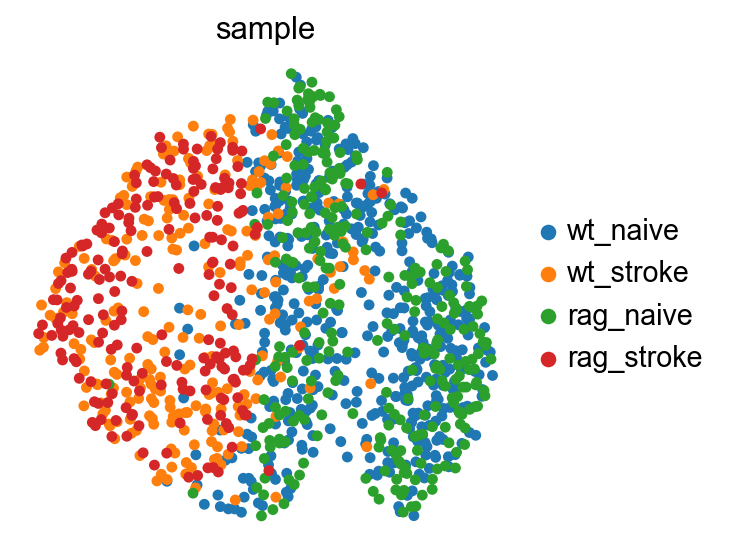

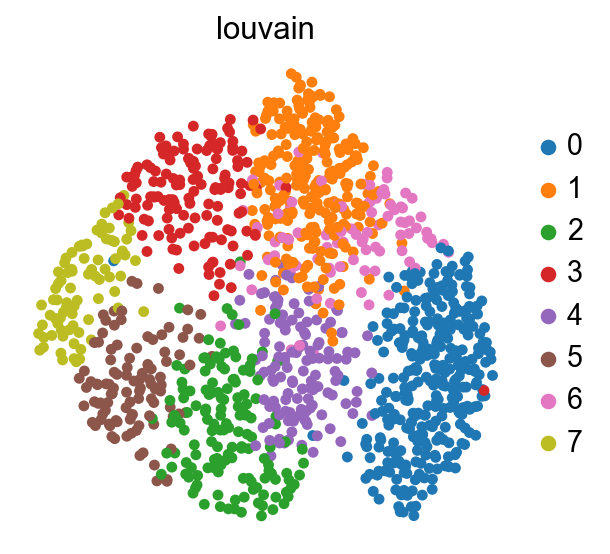

In [62]:
sc.pl.umap(adata_m_hvg,color=['sample'], save='_FIG_2C_microglia_samples.pdf')
sc.pl.umap(adata_m_hvg,color=['louvain'], save='_FIG_2S1B_microglia_clusters.pdf')

In [67]:
adata_m_hvg.uns['louvain_colors']

array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
       '#e377c2', '#bcbd22'], dtype=object)

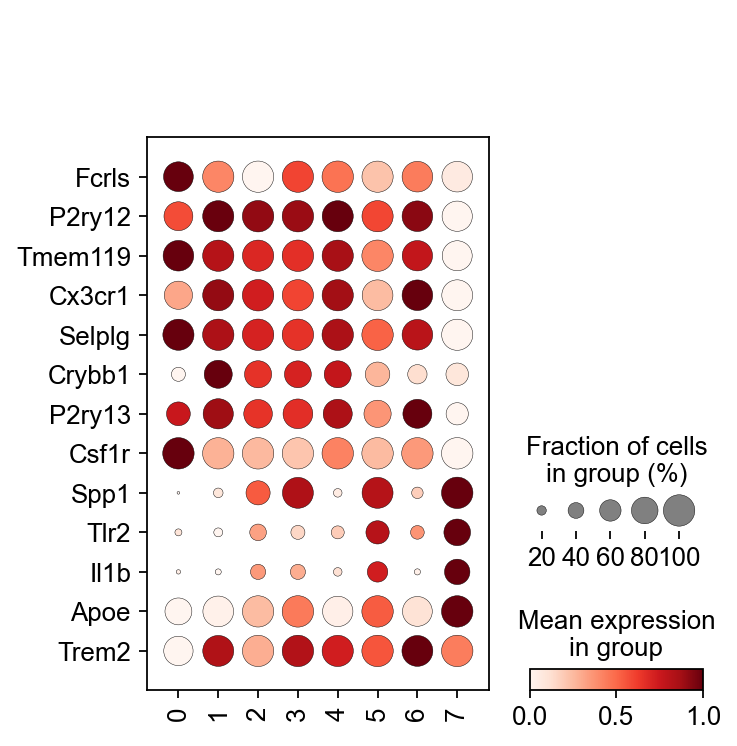

In [71]:
sc.pl.dotplot(adata_m, groupby='louvain',
                     swap_axes=True,  standard_scale='var',
                     var_names=['Fcrls', 'P2ry12', 'Tmem119', 'Cx3cr1', 'Selplg', 'Crybb1', 'P2ry13',
                                'Csf1r', 'Spp1', 'Tlr2', 'Il1b', 'Apoe', 'Trem2'], 
              save='_FIG_2S1C_microglia_markers.pdf')

In [363]:
## merge and annotate clusters
class_map = {
    '0':'Resting Microglia',
    '4':'Resting Microglia',
    '6':'Resting Microglia',
    '1':'Resting Microglia',
    
    '7':'Activated Microglia',
    '2':'Activated Microglia',
    '5':'Activated Microglia',
    '3':'Activated Microglia'
    }

adata_m_hvg.obs['cluster_anno'] = adata_m_hvg.obs['louvain']
adata_m_hvg.obs['cluster_anno'] = [
            class_map[x] if x in class_map.keys() else x
            for x in adata_m_hvg.obs['cluster_anno'].values
        ]
adata_m.obs['cluster_anno']=adata_m_hvg.obs['cluster_anno']

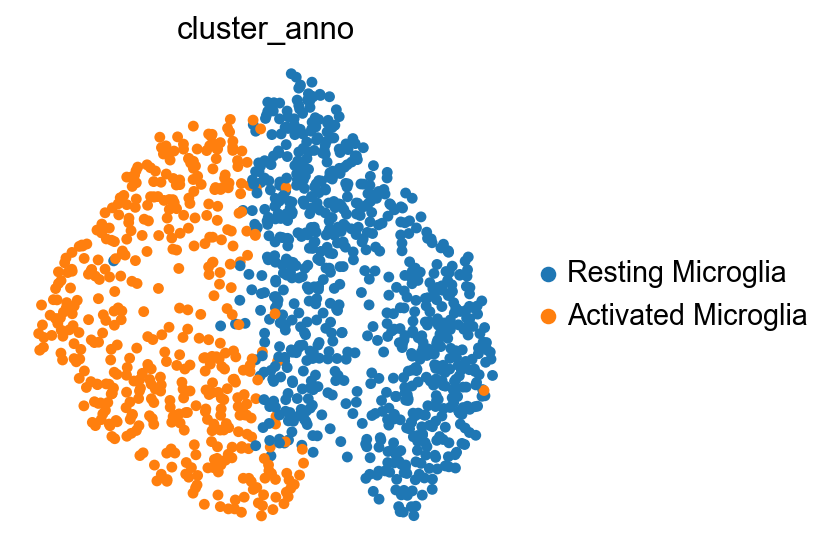

In [92]:
sc.pl.umap(adata_m_hvg,color=['cluster_anno'], save='_FIG_2C_microglia_cell_types.pdf')

### Gene sets

#### subset to stroke cells

In [80]:
adata_m.obs['condition'] = [a.split('_')[1] for a in adata_m.obs['sample']]
adata_m.obs['genotype'] = [a.split('_')[0] for a in adata_m.obs['sample']]

In [81]:
adata_m_sub = adata_m[adata_m.obs.louvain.isin(['5', '7', '2', '4'])].copy()

In [85]:
adata_m_sub = adata_m_sub[adata_m_sub.obs.condition.isin(['stroke'])].copy()
sc.pp.filter_genes(adata_m_sub, min_cells=10)

filtered out 3466 genes that are detected in less than 10 cells


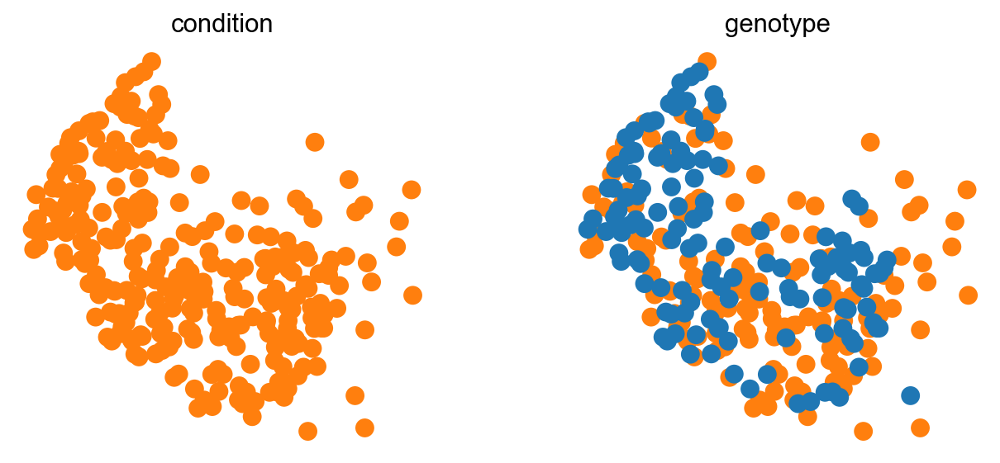

In [88]:
sc.pl.umap(adata_m_sub, color=['condition', 'genotype'], legend_loc=None, save='_FIG_2S2E.pdf')

#### compute gene sets on HVG genes

In [206]:
sc.pp.highly_variable_genes(adata_m_sub, n_top_genes=500)

In [207]:
adata_m_sub_hvg = adata_m_sub[:, adata_m_sub.var.highly_variable].copy()

In [86]:
df = adata_m_sub_hvg.to_df().T

In [87]:
df_corr = np.corrcoef(df)

In [88]:
from scipy.spatial import distance
from scipy.cluster import hierarchy
dist = distance.pdist(df_corr, metric='euclidean')
row_linkage = hierarchy.linkage(dist, method='ward')

In [90]:
clusters = hierarchy.fcluster(row_linkage, 1.5*dist.max(), 'distance')
np.unique(clusters)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int32)

In [91]:
df_corr = pd.DataFrame(df_corr)

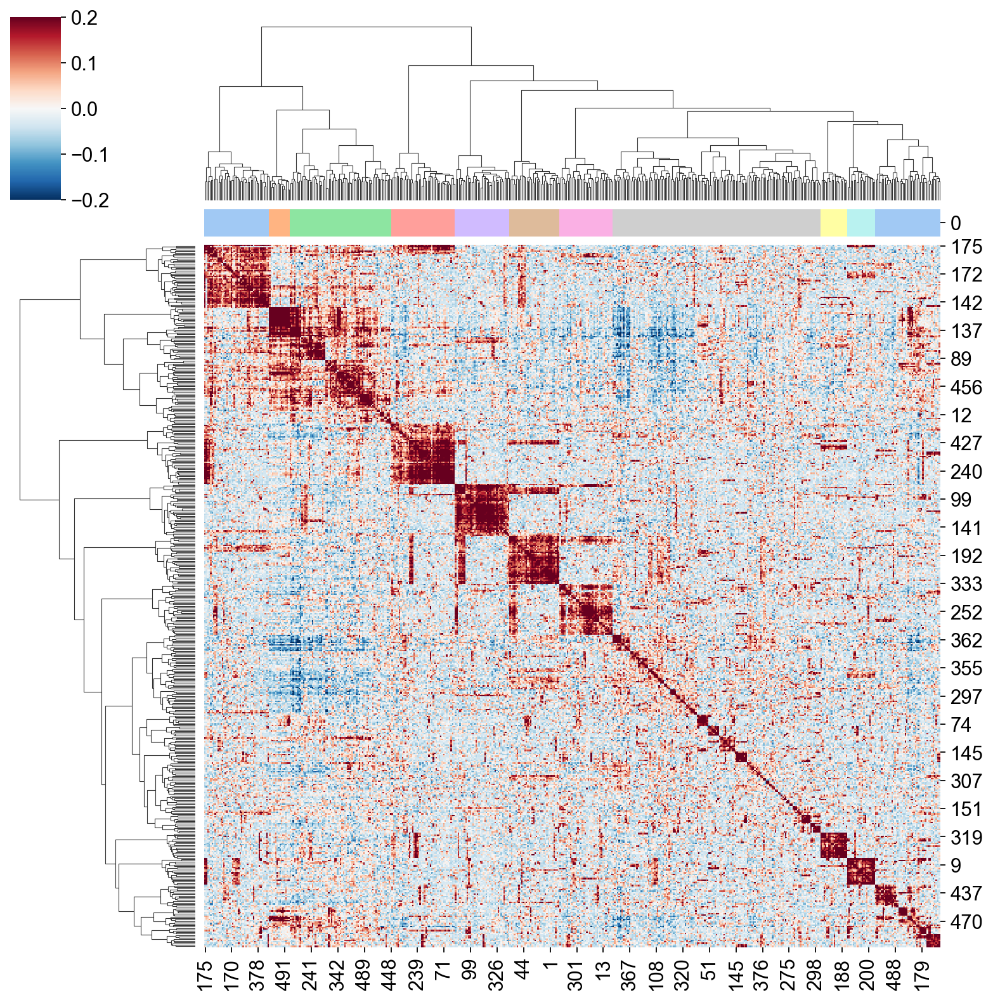

In [93]:
# # set colors for heatmap
col_dict = dict(zip(set(clusters), sns.color_palette('pastel', n_colors=len(np.unique(clusters)))))
col_colors = pd.DataFrame(clusters, index=df_corr.index)[0].map(col_dict)

sns.clustermap(df_corr, row_linkage=row_linkage, col_linkage=row_linkage, 
               col_colors=col_colors,
               cmap='RdBu_r', vmin=-0.2, vmax=0.2)

In [94]:
df_corr.index = adata_m_sub_hvg.var_names

In [95]:
df_corr.columns = adata_m_sub_hvg.var_names
df_corr['gene set'] = [f'G{clu}' for clu in clusters]
df_corr_gr = df_corr.groupby(['gene set']).mean()

In [96]:
df_corr_gr = df_corr_gr.T
df_corr_gr['gene set'] = [f'G{clu}' for clu in clusters]

In [100]:
df_corr_gr_mean = df_corr_gr.groupby(['gene set']).mean()

In [101]:
df_corr_gr_mean = df_corr_gr_mean.loc[['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10','G11'], 
                                      ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11']]

In [102]:
df_diag = pd.DataFrame(np.diag(df_corr_gr_mean), index = df_corr_gr_mean.index)

In [103]:
df_diag.style.background_gradient(cmap='coolwarm', axis=1, vmin=-0.3, vmax=0.3).format('{:.2g}')

,0
gene set,
G1,0.16
G2,0.49
G3,0.11
G4,0.19
G5,0.21
G6,0.2
G7,0.15
G8,0.022
G9,0.24


#### pathway enrichment of gene sets

In [113]:
enr_dict = {}
for i in range(1,12):
    genes = adata_m_sub_hvg.var_names[clusters==i].tolist()
    enr = gp.enrichr(gene_list=genes, gene_sets='GO_Biological_Process_2018', organism='mouse')
    enr_dict[str(i)]=enr.res2d    

2020-11-23 14:04:40,431 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:04:51,527 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:04:54,949 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:04:58,309 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:05:01,832 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:05:09,238 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:05:12,773 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-11-23 14:05:16,309 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05


/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  if sys.path[0] == '':


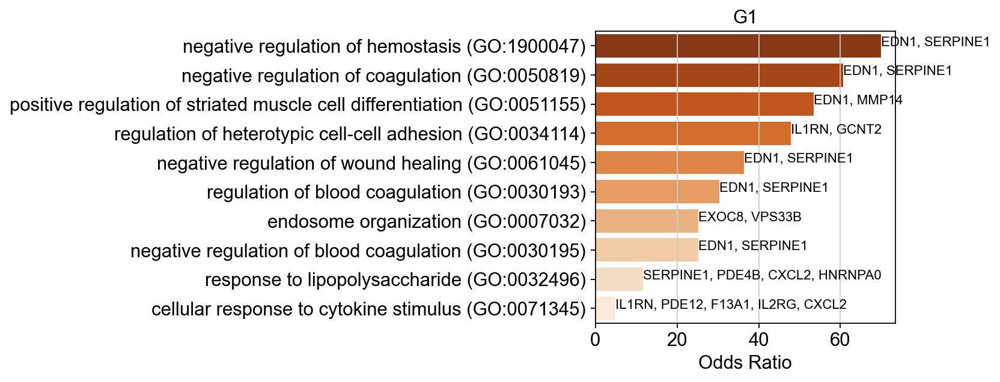

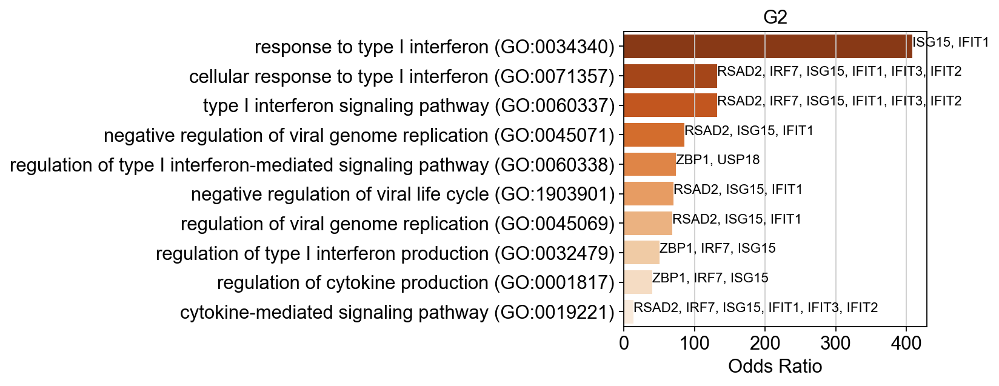

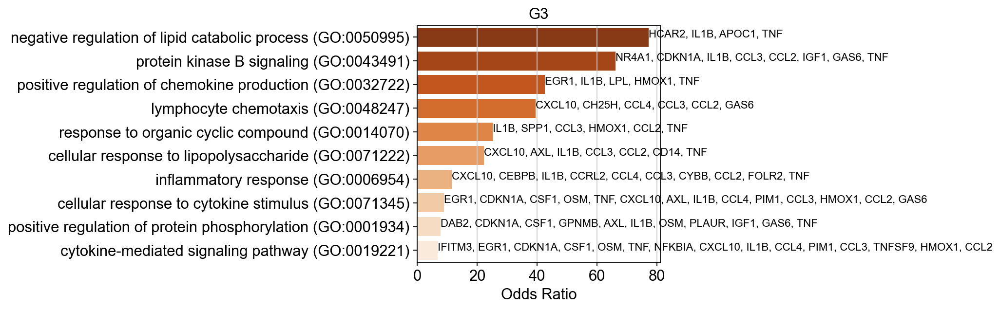

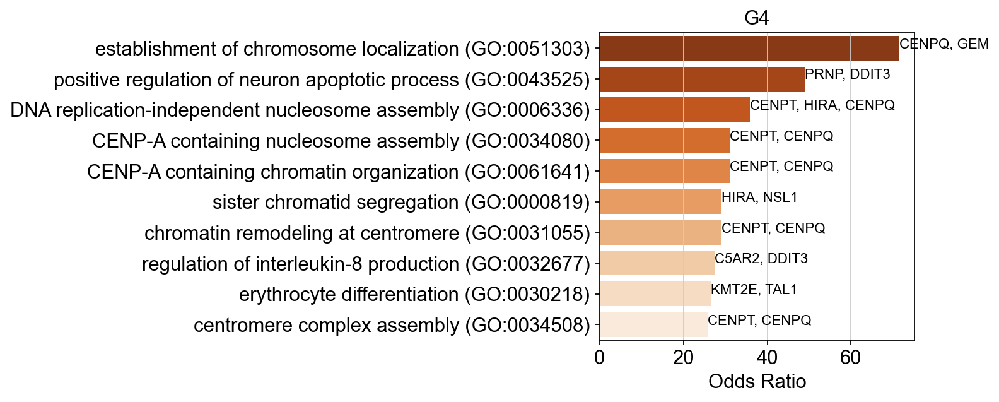

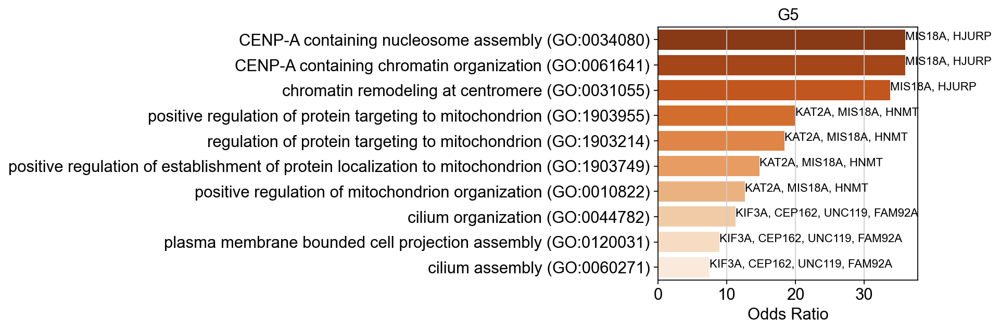

...

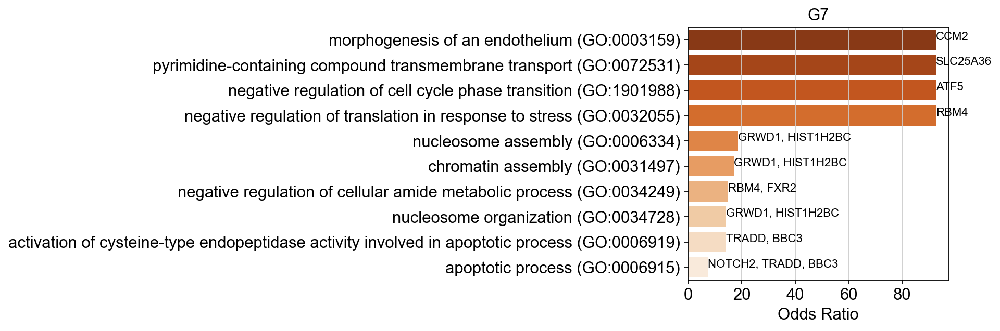

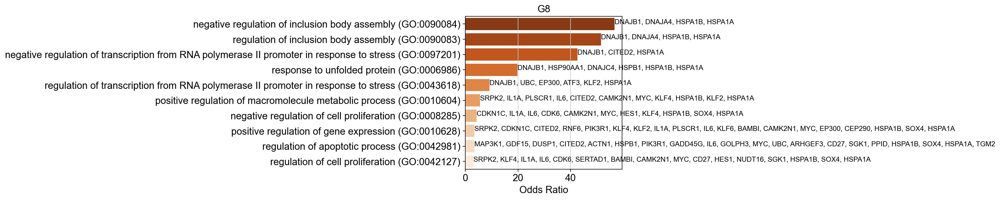

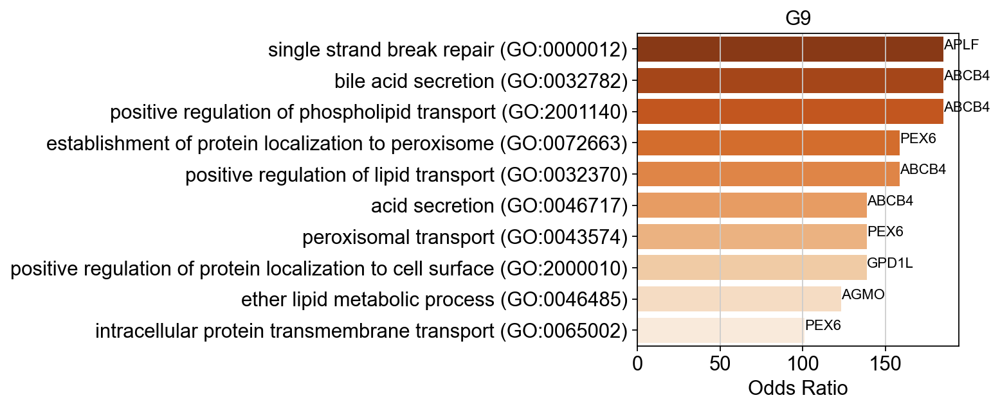

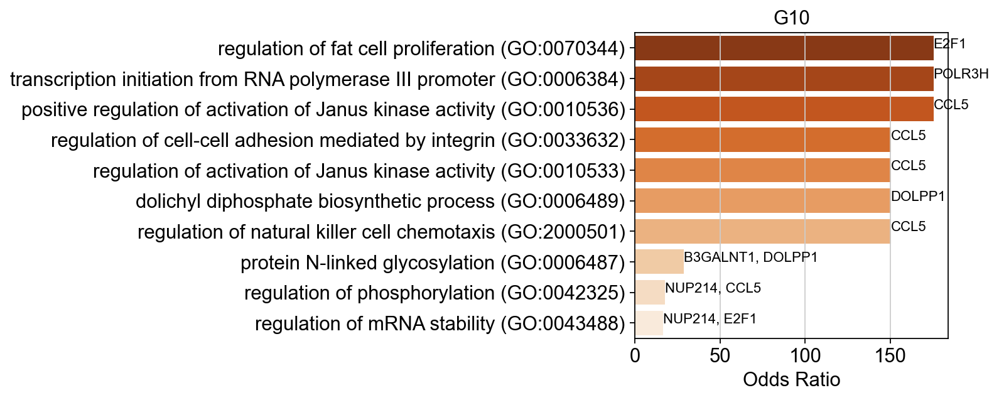

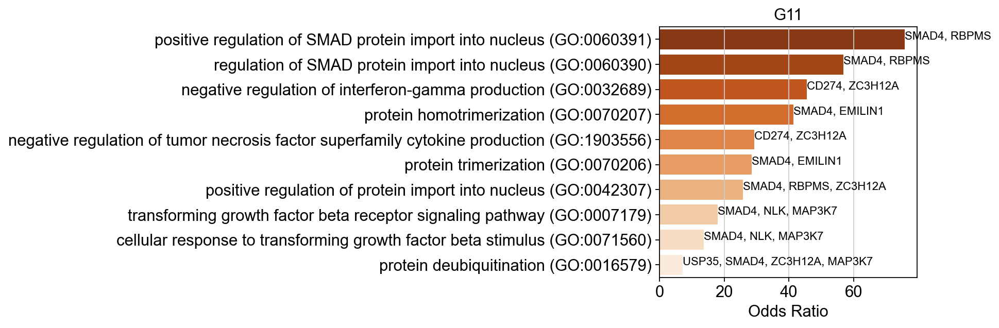

In [114]:
for key in enr_dict.keys():
    fig,ax = pl.subplots()
    sns.barplot(data=enr_dict[key].head(10).sort_values(by='Odds Ratio', ascending=False),
                y='Term', x='Odds Ratio', orient='horizontal', palette='Oranges_r', ax=ax)
    
    i=0
    for index, row in enr_dict[key].head(10).sort_values(by='Odds Ratio', ascending=False).iterrows():
        ax.text(row['Odds Ratio'], i, row.Genes.replace(';', ', '), color='black', ha="left", fontsize=10)
        i+=1
    pl.ylabel('')
    pl.title(f'G{key}')
    pl.tight_layout()

#### Cell scoring

In [115]:
for i in range(1,12):
    sc.settings.verbosity=0
    genes = adata_m_sub_hvg.var_names[clusters==i].tolist()
    sc.tl.score_genes(adata_m_sub_hvg, gene_list=genes, score_name=f'G{i}')  

#### cluster scores

In [157]:
adata_g = sc.AnnData(adata_m_sub_hvg.obs[['G1', 'G2', 'G3', 'G4', 'G5', 'G6' ,'G7', 'G9', 'G10', 'G11']])

In [171]:
adata_g.obs = adata_m_sub_hvg.obs

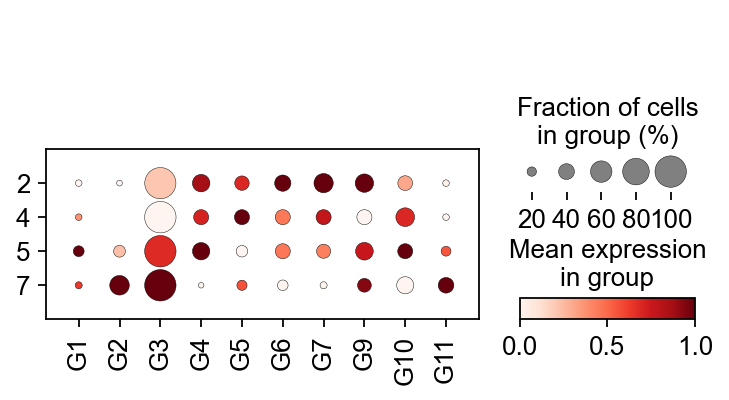

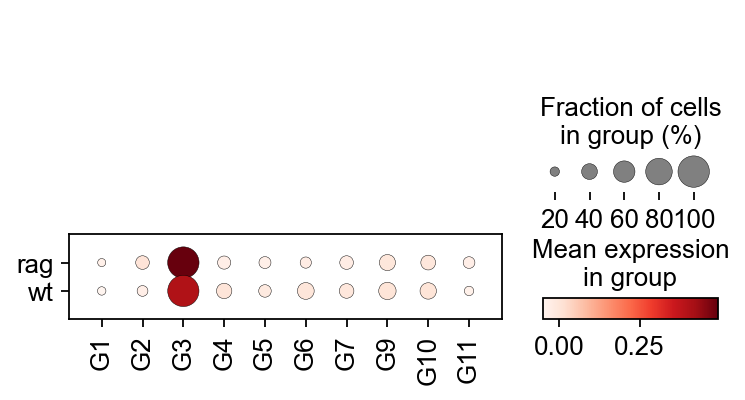

In [152]:
sc.pl.dotplot(adata_g, groupby='louvain', var_names=adata_g.var_names, standard_scale='var')
sc.pl.dotplot(adata_g, groupby='genotype', var_names=adata_g.var_names)

#### differential test

In [ ]:
# remove outlier cells with very high scores (>0.6) for gene sets of interest

In [173]:
adata_g_sub = adata_g[:,['G1', 'G4', 'G5', 'G6' ,'G7', 'G9', 'G10', 'G11']].copy()

In [175]:
adata_g = adata_g[np.invert([any(row) for row in adata_g_sub.X>0.6]),:].copy()

In [177]:
# remove .obs fields for plotting to avoid overlap with .X
for key in ['G1', 'G2', 'G3', 'G4', 'G5', 'G6' ,'G7', 'G9', 'G10', 'G11']:
    del adata_g.obs[key]

In [178]:
adata_g

AnnData object with n_obs × n_vars = 276 × 10
    obs: 'sample', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'doublet_score', 'louvain', 'louvain_refined', 'cluster_anno', 'louvain_r2', 'cluster_traj', 'dpt_pseudotime', 'condition', 'genotype', 'traj_genotype', 'G8'

/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


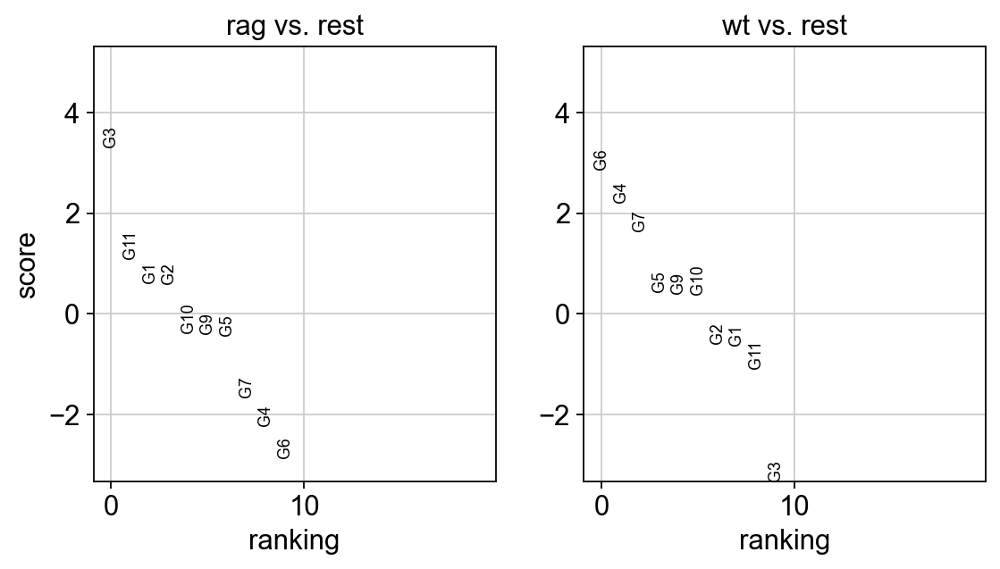

In [181]:
sc.tl.rank_genes_groups(adata_g, groupby='genotype', method='wilcoxon')
sc.pl.rank_genes_groups(adata_g)

In [183]:
sc.get.rank_genes_groups_df(adata_g, group='rag')

,scores,names,logfoldchanges,pvals,pvals_adj
0,3.316544,G3,0.308638,0.000911,0.009114
1,1.087404,G11,-0.414968,0.276858,0.553717
2,0.618032,G1,-0.035954,0.536554,0.699786
3,0.598412,G2,NaN,0.549565,0.699786
4,-0.385610,G10,-0.078327,0.699786,0.699786
5,-0.402211,G9,0.074344,0.687529,0.699786
6,-0.439942,G5,0.300512,0.659979,0.699786
7,-1.647330,G7,0.930985,0.099490,0.248726
8,-2.217821,G4,1.249813,0.026567,0.088557
9,-2.863774,G6,1.412309,0.004186,0.020931


### Trajectory analyses

#### PAGA and annotation

In [5]:
sc.tl.paga(adata_m_hvg,groups='louvain')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


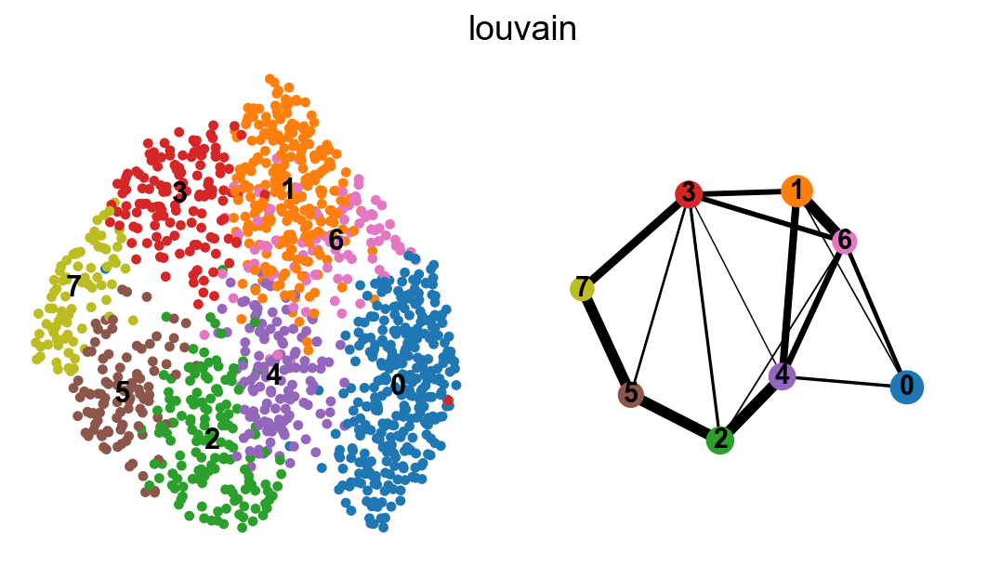

In [6]:
sc.pl.paga_compare(adata_m_hvg, threshold=0.1, edge_width_scale=0.7, save='_Figure_2S2A_microglia.pdf')

--> added 'pos', the PAGA positions (adata.uns['paga'])


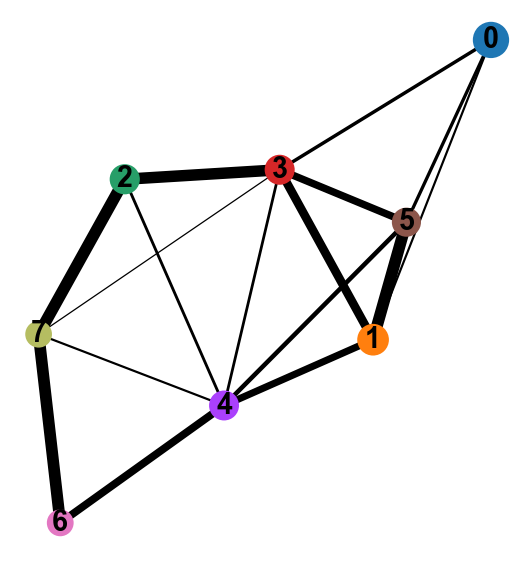

In [21]:
sc.pl.paga(adata_m_hvg, edge_width_scale=0.7, threshold=0.1)

In [73]:
## merge and annotate trajectory
class_map = {
    '0':'root',
    '7':'end',
    
    '4':'path1',
    '2':'path1',
    '5':'path1',
    
    '6':'path2',
    '1':'path2',
    '3':'path2'
    }

adata_m_hvg.obs['cluster_traj'] = adata_m_hvg.obs['louvain']
adata_m_hvg.obs['cluster_traj'] = [
            class_map[x] if x in class_map.keys() else x
            for x in adata_m_hvg.obs['cluster_traj'].values
        ]

adata_m.obs['cluster_traj']=adata_m_hvg.obs['cluster_traj']

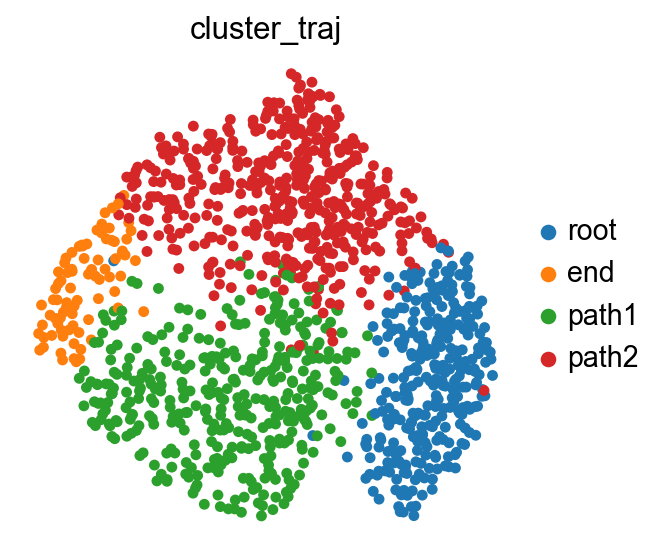

In [6]:
sc.pl.umap(adata_m_hvg,color=['cluster_traj'], save='_FIG_S1D_microglia_trajectory.pdf')

In [10]:
adata_m_hvg.uns['cluster_traj_colors'] = ['#fdd0a2', '#a63603', '#fd8d3c', '#e6550d', ]

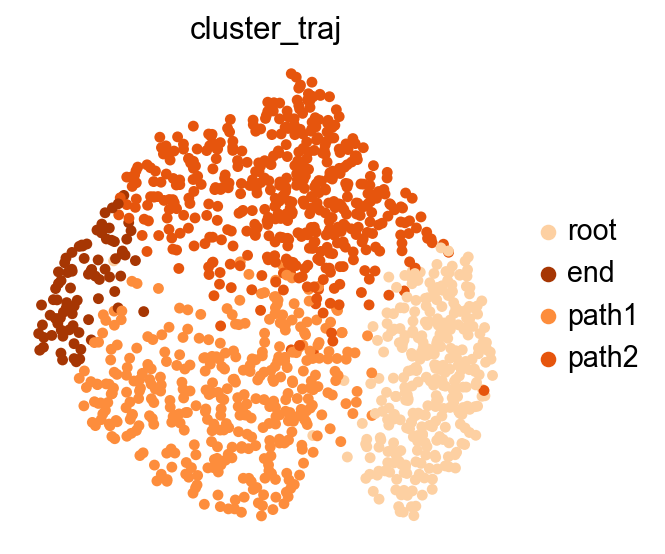

In [11]:
sc.pl.umap(adata_m_hvg,color=['cluster_traj'], save='_FIG_S1D_microglia_trajectory_updatedcolors.pdf')

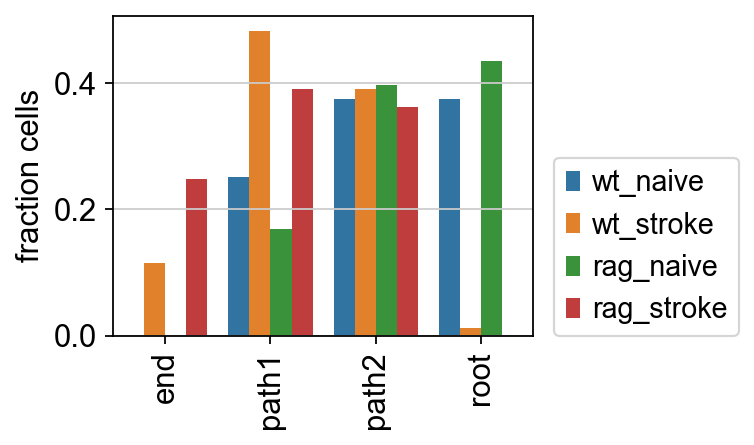

In [94]:
group='cluster_traj'
split='sample'
df=pd.crosstab(columns=adata_m_hvg.obs[group], index=adata_m_hvg.obs[split], normalize='index')
df=df.unstack().reset_index()
df=pd.DataFrame(df.values, columns=[group,split,'values'])

rcParams['figure.figsize'] = (5, 3)
ax = sns.barplot(x=group,y='values', hue=split, data=df, 
                 palette=adata_m_hvg.uns[split+'_colors'])

ax.legend(loc=(1.05,0))
pl.ylabel('fraction cells')
pl.xlabel(None)
pl.xticks(rotation=90)
pl.tight_layout()
pl.show()
sc.set_figure_params(vector_friendly=True, color_map='viridis', dpi_save=300, transparent=True, frameon=False)

In [95]:
pd.crosstab(adata_m.obs['sample'], adata_m.obs.cluster_traj)

cluster_traj,root,end,path1,path2
sample,,,,
wt_naive,187,0,125,187
wt_stroke,3,29,121,98
rag_naive,129,0,50,118
rag_stroke,0,52,82,76


In [18]:
adata_m.obs['traj_genotype'] = ['_'.join([a,b.split('_')[0]]) for a,b in zip(adata_m.obs.cluster_traj, adata_m.obs['sample'])]

In [19]:
adata_m.obs['genotype'] = [b.split('_')[0] for b in adata_m.obs['sample']]

#### diffusion pseudotime inference

In [12]:
sc.tl.diffmap(adata_m_hvg)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.96029264 0.9142908  0.90674794 0.8641383  0.8354395
     0.78185934 0.7686461  0.75680757 0.75523436 0.731698   0.726925
     0.710005   0.69740903 0.68671644]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


In [13]:
adata_m_hvg.uns['iroot']=np.flatnonzero(np.array(np.isin(adata_m_hvg.obs['cluster_traj'],['root'])))[2]
sc.tl.dpt(adata_m_hvg)
adata_m.obs['dpt_pseudotime']=adata_m_hvg.obs['dpt_pseudotime']

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


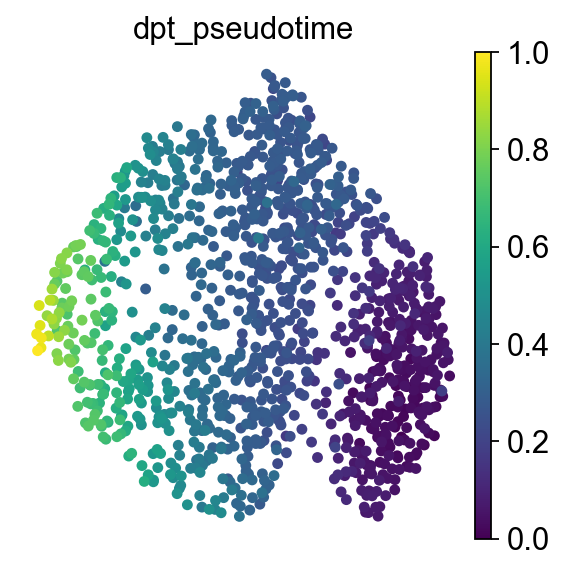

In [14]:
sc.set_figure_params(frameon=False)
sc.pl.umap(adata_m,color='dpt_pseudotime')

#### Path 1 trajectory - cell densities

In [20]:
adata_m_path1 = adata_m[adata_m.obs['cluster_traj'].isin(['root', 'end', 'path1'])].copy()

In [21]:
sc.pp.filter_genes(adata_m_path1, min_cells=20)

filtered out 3813 genes that are detected in less than 20 cells


#### Path 1 trajectory - differential expresssion root vs. end in wt and rag

In [23]:
sc.tl.rank_genes_groups(adata_m_path1, groupby='traj_genotype', 
                        key_added='root_end_wt',groups=['root_wt'], 
                        reference='end_wt', n_genes=3000)

sc.tl.rank_genes_groups(adata_m_path1, groupby='traj_genotype', 
                        key_added='end_root_wt',groups=['end_wt'], 
                        reference='root_wt', n_genes=3000)

sc.tl.rank_genes_groups(adata_m_path1, groupby='traj_genotype', 
                        key_added='root_end_rag',groups=['root_rag'], 
                        reference='end_rag', n_genes=3000)

sc.tl.rank_genes_groups(adata_m_path1, groupby='traj_genotype', 
                        key_added='end_root_rag',groups=['end_rag'], 
                        reference='root_rag', n_genes=3000)

ranking genes


... storing 'traj_genotype' as categorical
... storing 'genotype' as categorical


    finished: added to `.uns['root_end_wt']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['end_root_wt']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['root_end_rag']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals'

In [24]:
df_wt_dn = sc.get.rank_genes_groups_df(adata_m_path1, group='root_wt', key='root_end_wt')
g_wt_dn = df_wt_dn.loc[df_wt_dn.pvals_adj<0.05]['names'].tolist()

df_wt_up = sc.get.rank_genes_groups_df(adata_m_path1, group='end_wt', key='end_root_wt')
g_wt_up = df_wt_up.loc[df_wt_up.pvals_adj<0.05]['names'].tolist()

df_rag_dn = sc.get.rank_genes_groups_df(adata_m_path1, group='root_rag', key='root_end_rag')
g_rag_dn = df_rag_dn.loc[df_rag_dn.pvals_adj<0.05]['names'].tolist()

df_rag_up = sc.get.rank_genes_groups_df(adata_m_path1, group='end_rag', key='end_root_rag')
g_rag_up = df_rag_up.loc[df_rag_up.pvals_adj<0.05]['names'].tolist()

#### subset cells for visualization

subset root, path1 cells for plotting as such that state representation is balanced

In [39]:
adata_m_path1_wt = adata_m_path1[adata_m_path1.obs.traj_genotype.isin(['root_wt', 'path1_wt', 'end_wt'])].copy()
adata_m_path1_rag = adata_m_path1[adata_m_path1.obs.traj_genotype.isin(['root_rag', 'path1_rag', 'end_rag'])].copy()

In [40]:
adata_m_path1_wt.obs.cluster_traj.value_counts()

path1    246
root     190
end       29
Name: cluster_traj, dtype: int64

In [41]:
x1 = sc.pp.subsample(adata_m_path1_wt[adata_m_path1_wt.obs.cluster_traj.isin(['root', 'path1'])].copy(), n_obs=100, copy=True).obs_names
x2 = adata_m_path1_wt[adata_m_path1_wt.obs.cluster_traj.isin(['end'])].copy().obs_names
adata_m_path1_wt_sub = adata_m_path1_wt[x1.append(x2)].copy()

In [42]:
adata_m_path1_wt_sub.obs.cluster_traj.value_counts()

path1    59
root     41
end      29
Name: cluster_traj, dtype: int64

In [43]:
adata_m_path1_rag.obs.cluster_traj.value_counts()

path1    132
root     129
end       52
Name: cluster_traj, dtype: int64

In [44]:
x1 = sc.pp.subsample(adata_m_path1_rag[adata_m_path1_rag.obs.cluster_traj.isin(['root', 'path1'])].copy(),n_obs=100, copy=True).obs_names
x2 = adata_m_path1_rag[adata_m_path1_rag.obs.cluster_traj.isin(['end'])].copy().obs_names
adata_m_path1_rag_sub = adata_m_path1_rag[x1.append(x2)].copy()

In [45]:
adata_m_path1_rag_sub.obs.cluster_traj.value_counts()

end      52
root     52
path1    48
Name: cluster_traj, dtype: int64

#### Path 1 trajectory - regulated genes in **_RAG_** only

In [50]:
comb_dn_rag = list(set(g_rag_dn).difference(df_wt_dn.loc[df_wt_dn.logfoldchanges>0.1]['names'].tolist()))
comb_up_rag = list(set(g_rag_up).difference(df_wt_up.loc[df_wt_up.logfoldchanges>0.1]['names'].tolist()))

saving figure to file ./figures/scvelo_heatmap__heatmap_FIG_S1D_WT.svg


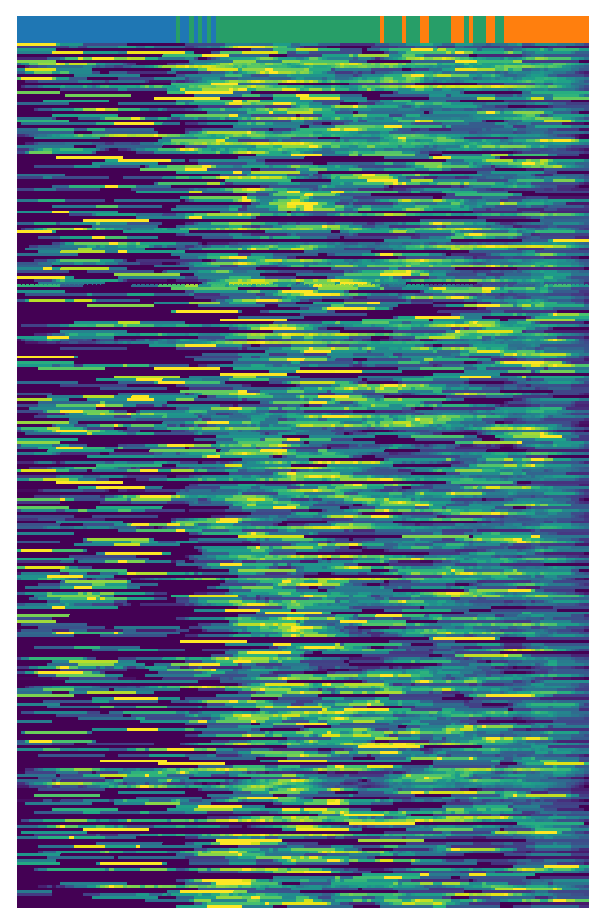

saving figure to file ./figures/scvelo_heatmap__heatmap_FIG_S1D_RAG.svg


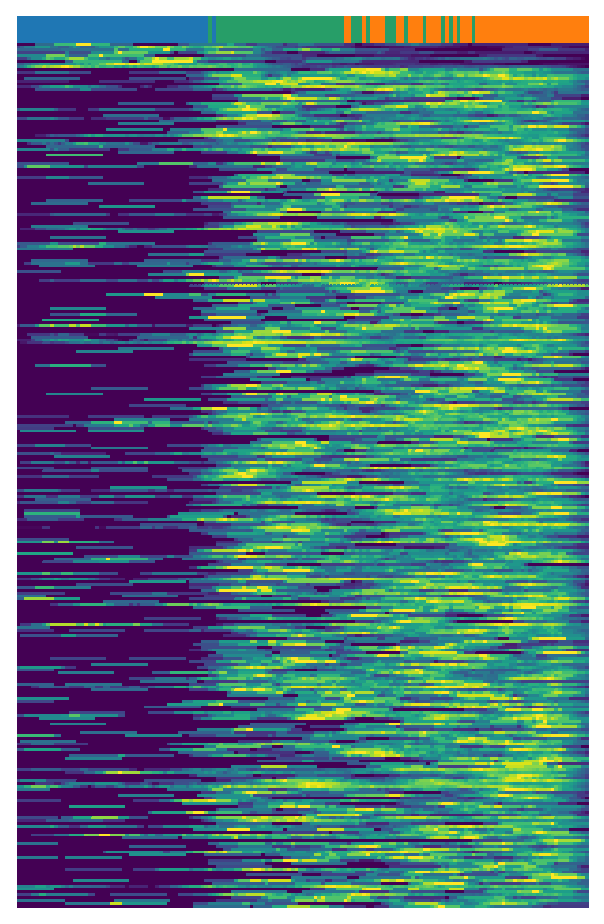

In [58]:
gene_names = comb_dn_rag + comb_up_rag
scv.pl.heatmap(adata_m_path1_wt_sub, sortby='dpt_pseudotime', var_names=gene_names, sort=False, 
               yticklabels=False, figsize=(4, 6), n_convolve=15, col_color='cluster_traj', save='_heatmap_FIG_S1D_WT.svg')
scv.pl.heatmap(adata_m_path1_rag_sub, sortby='dpt_pseudotime', var_names=gene_names, sort=False, 
               yticklabels=False, figsize=(4, 6), n_convolve=15, col_color='cluster_traj', save='_heatmap_FIG_S1D_RAG.svg')